# Proyecto 2
## Security Data Science
### Manuel Archila 161250

#### 1. Importar ibrerias necesarias

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('data.csv')
df.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,trans_num,unix_time,merch_lat,merch_long,is_fraud,amt_month,amt_year,amt_month_shopping_net_spend,count_month_shopping_net,first_time_at_merchant
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,...,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,4.97,4.97,0.0,0.0,True
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,...,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,107.23,107.23,0.0,0.0,True
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,...,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,220.11,220.11,0.0,0.0,True
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,...,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,45.00,45.00,0.0,0.0,True
4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,...,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,41.96,41.96,0.0,0.0,True


In [3]:
df.describe()

,cc_num,amt,zip,lat,long,city_pop,unix_time,merch_lat,merch_long,is_fraud,amt_month,amt_year,amt_month_shopping_net_spend,count_month_shopping_net
count,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06
mean,4.173860e+17,7.006357e+01,4.881326e+04,3.853931e+01,-9.022783e+01,8.864367e+04,1.358674e+09,3.853898e+01,-9.022794e+01,5.210015e-03,4.153689e+03,4.530560e+04,3.762028e+02,4.567241e+00
std,1.309115e+18,1.592540e+02,2.688185e+04,5.071470e+00,1.374789e+01,3.014876e+05,1.819508e+07,5.105604e+00,1.375969e+01,7.199217e-02,3.909005e+03,3.586752e+04,7.253531e+02,4.575502e+00
min,6.041621e+10,1.000000e+00,1.257000e+03,2.002710e+01,-1.656723e+02,2.300000e+01,1.325376e+09,1.902742e+01,-1.666716e+02,0.000000e+00,1.000000e+00,1.020000e+00,0.000000e+00,0.000000e+00
25%,1.800429e+14,9.640000e+00,2.623700e+04,3.466890e+01,-9.679800e+01,7.410000e+02,1.343017e+09,3.474012e+01,-9.689944e+01,0.000000e+00,1.344790e+03,1.734142e+04,9.020000e+00,1.000000e+00
50%,3.521417e+15,4.745000e+01,4.817400e+04,3.935430e+01,-8.747690e+01,2.443000e+03,1.357089e+09,3.936890e+01,-8.744069e+01,0.000000e+00,3.071990e+03,3.743910e+04,7.589000e+01,3.000000e+00
75%,4.642255e+15,8.310000e+01,7.204200e+04,4.194040e+01,-8.015800e+01,2.032800e+04,1.374581e+09,4.195626e+01,-8.024511e+01,0.000000e+00,5.738470e+03,6.472088e+04,4.259800e+02,7.000000e+00
max,4.992346e+18,2.894890e+04,9.992100e+04,6.669330e+01,-6.795030e+01,2.906700e+06,1.388534e+09,6.751027e+01,-6.695090e+01,1.000000e+00,4.326189e+04,2.190868e+05,1.204718e+04,4.800000e+01


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1852394 entries, 0 to 1852393
Data columns (total 27 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   trans_date_trans_time         object 
 1   cc_num                        int64  
 2   merchant                      object 
 3   category                      object 
 4   amt                           float64
 5   first                         object 
 6   last                          object 
 7   gender                        object 
 8   street                        object 
 9   city                          object 
 10  state                         object 
 11  zip                           int64  
 12  lat                           float64
 13  long                          float64
 14  city_pop                      int64  
 15  job                           object 
 16  dob                           object 
 17  trans_num                     object 
 18  unix_time             

In [5]:
df['trans_date_trans_time'] = pd.to_datetime(df['trans_date_trans_time'])
df = df.sort_values(by='trans_date_trans_time')
df["cc_num"] = df["cc_num"].astype(str)

#### Verificar si el dataset esta balanceado

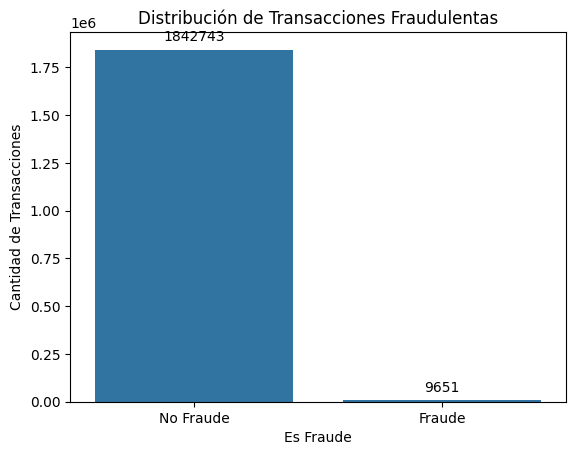

In [6]:
fraud_counts = df["is_fraud"].value_counts()

ax = sns.barplot(x=fraud_counts.index, y=fraud_counts.values)

plt.title('Distribución de Transacciones Fraudulentas')
plt.xlabel('Es Fraude')
plt.ylabel('Cantidad de Transacciones')
plt.xticks(ticks=[0, 1], labels=['No Fraude', 'Fraude'])

for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center',  
                xytext=(0, 9), 
                textcoords='offset points')

plt.show()


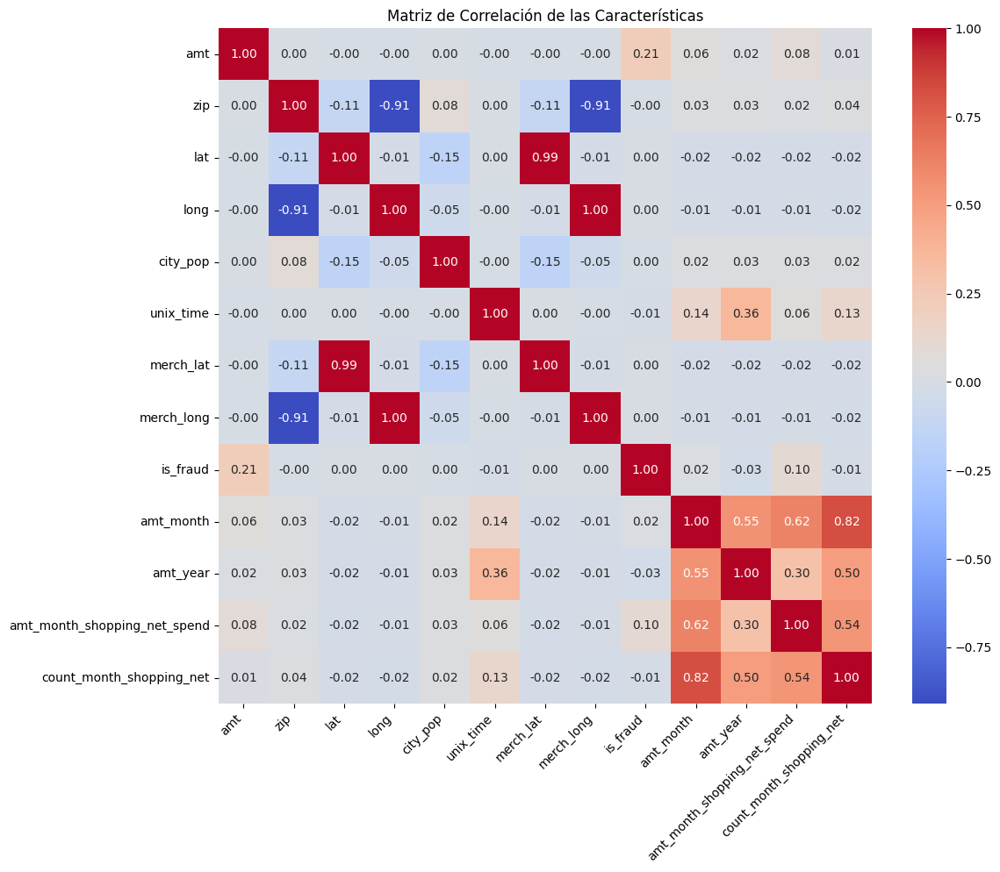

In [7]:
df_numeric = df.select_dtypes(include=['float64', 'int64'])

corr_matrix = df_numeric.corr()

plt.figure(figsize=(12, 10)) 
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)

plt.title('Matriz de Correlación de las Características')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

plt.show()

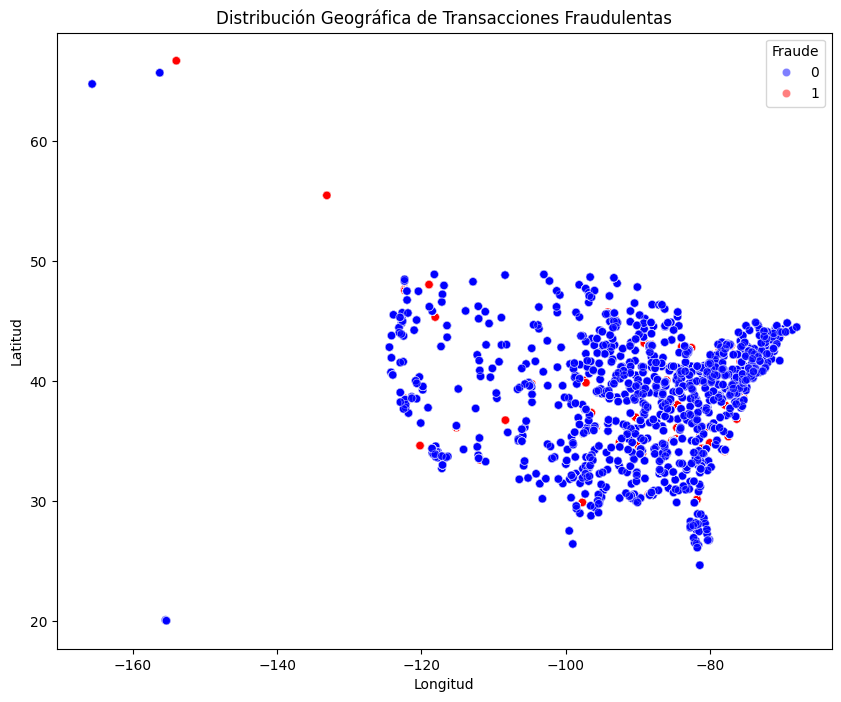

In [8]:
plt.figure(figsize=(10, 8))
sns.scatterplot(x='long', y='lat', hue='is_fraud', data=df, palette={0: 'blue', 1: 'red'}, alpha=0.5)

plt.title('Distribución Geográfica de Transacciones Fraudulentas')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.legend(title='Fraude')


plt.show()

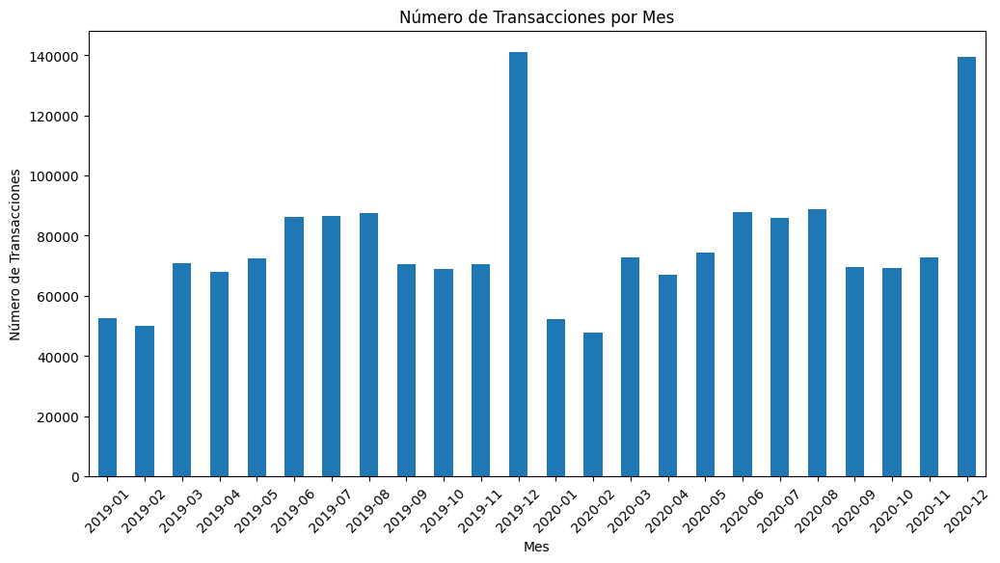

In [9]:
df['year_month'] = df['trans_date_trans_time'].dt.to_period('M')

monthly_transactions = df.groupby('year_month').size()

monthly_transactions.plot(kind='bar', figsize=(12, 6))
plt.title('Número de Transacciones por Mes')
plt.xlabel('Mes')
plt.ylabel('Número de Transacciones')
plt.xticks(rotation=45) 
plt.show()


## Feature Engineering

In [10]:
def get_amount_month_by_card(group):
    """
    Calculate the cumulative sum of transaction amounts per month for each credit card.

    Parameters:
    - group (DataFrame): A group of transactions for a specific credit card.

    Returns:
    DataFrame: The input DataFrame with an additional column 'amt_month' representing
    the cumulative sum of transaction amounts per month for each credit card.
    """
    group['amt_month'] = group.groupby([group['trans_date_trans_time'].dt.year, group['trans_date_trans_time'].dt.month])['amt'].cumsum()
    return group

In [11]:
df = df.groupby('cc_num').apply(get_amount_month_by_card).reset_index(drop=True)

C:\Users\aleja\AppData\Local\Temp\ipykernel_6560\224686189.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby('cc_num').apply(get_amount_month_by_card).reset_index(drop=True)


In [12]:
def get_amount_anual_by_card(group):
    """
    Calculate the cumulative sum of transaction amounts per year for each credit card.

    Parameters:
    - group (DataFrame): A group of transactions for a specific credit card.

    Returns:
    DataFrame: The input DataFrame with an additional column 'amt_year' representing
    the cumulative sum of transaction amounts per year for each credit card.
    """
    group['amt_year'] = group.groupby(group['trans_date_trans_time'].dt.year)['amt'].cumsum()
    return group

In [13]:
df = df.groupby('cc_num').apply(get_amount_anual_by_card).reset_index(drop=True)

C:\Users\aleja\AppData\Local\Temp\ipykernel_6560\1588978674.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby('cc_num').apply(get_amount_anual_by_card).reset_index(drop=True)


In [14]:
year_month = ['2019-01', '2019-02', '2019-03', '2019-04', '2019-05', '2019-06', '2019-07',
 '2019-08', '2019-09', '2019-10', '2019-11', '2019-12', '2020-01', '2020-02',
 '2020-03', '2020-04', '2020-05', '2020-06', '2020-07', '2020-08', '2020-09',
 '2020-10', '2020-11', '2020-12']

def get_amount_month_by_card_shopping_net_spend(group):
    """
    Calculate the cumulative monthly spending on shopping_net category for each credit card.

    Parameters:
    - group (DataFrame): A group of transactions for a specific credit card.

    Returns:
    DataFrame: The input DataFrame with an additional column 'amt_month_shopping_net_spend' representing
    the cumulative monthly spending on shopping_net category for each credit card.
    """
    
    subset_shopping_net = group[group['category'] == 'shopping_net']
    group['amt_month_shopping_net_spend'] = subset_shopping_net.groupby(group['trans_date_trans_time'].dt.to_period('M'))['amt'].cumsum()

    group['y_month'] = group['trans_date_trans_time'].dt.to_period('M')
    for y_month in year_month:
        group.loc[group['y_month'] == y_month, 'amt_month_shopping_net_spend'] = group.loc[group['y_month'] == y_month, 'amt_month_shopping_net_spend'].fillna(method='ffill')
        group.loc[group['y_month'] == y_month, 'amt_month_shopping_net_spend'] = group.loc[group['y_month'] == y_month, 'amt_month_shopping_net_spend'].fillna(0)
        
    return group.drop('y_month', axis=1)

In [15]:
df = df.groupby('cc_num').apply(get_amount_month_by_card_shopping_net_spend).reset_index(drop=True)

C:\Users\aleja\AppData\Local\Temp\ipykernel_6560\3902549970.py:23: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group.loc[group['y_month'] == y_month, 'amt_month_shopping_net_spend'] = group.loc[group['y_month'] == y_month, 'amt_month_shopping_net_spend'].fillna(method='ffill')
C:\Users\aleja\AppData\Local\Temp\ipykernel_6560\3902549970.py:23: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group.loc[group['y_month'] == y_month, 'amt_month_shopping_net_spend'] = group.loc[group['y_month'] == y_month, 'amt_month_shopping_net_spend'].fillna(method='ffill')
C:\Users\aleja\AppData\Local\Temp\ipykernel_6560\3902549970.py:23: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group.loc[group['y_month'] == y_month, 'amt_month_shopping_n

In [16]:
def get_count_trx_month_by_card_shopping_net(group):
    """
    Calculate the cumulative count of transactions in the shopping_net category per month for each credit card.

    Parameters:
    - group (DataFrame): A group of transactions for a specific credit card.

    Returns:
    DataFrame: The input DataFrame with an additional column 'count_month_shopping_net' representing
    the cumulative count of transactions in the shopping_net category per month for each credit card.
    """
    
    subset_shopping_net = group[group['category'] == 'shopping_net']
    group['count_month_shopping_net'] = subset_shopping_net.groupby(group['trans_date_trans_time'].dt.to_period('M')).cumcount() + 1

    group['y_month'] = group['trans_date_trans_time'].dt.to_period('M')
    for y_month in year_month:
        group.loc[group['y_month'] == y_month, 'count_month_shopping_net'] = group.loc[group['y_month'] == y_month, 'count_month_shopping_net'].fillna(method='ffill')
        group.loc[group['y_month'] == y_month, 'count_month_shopping_net'] = group.loc[group['y_month'] == y_month, 'count_month_shopping_net'].fillna(0)
        
    return group.drop('y_month', axis=1)

In [17]:
df = df.groupby('cc_num').apply(get_count_trx_month_by_card_shopping_net).reset_index(drop=True)

C:\Users\aleja\AppData\Local\Temp\ipykernel_6560\297990386.py:18: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group.loc[group['y_month'] == y_month, 'count_month_shopping_net'] = group.loc[group['y_month'] == y_month, 'count_month_shopping_net'].fillna(method='ffill')
C:\Users\aleja\AppData\Local\Temp\ipykernel_6560\297990386.py:18: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group.loc[group['y_month'] == y_month, 'count_month_shopping_net'] = group.loc[group['y_month'] == y_month, 'count_month_shopping_net'].fillna(method='ffill')
C:\Users\aleja\AppData\Local\Temp\ipykernel_6560\297990386.py:18: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group.loc[group['y_month'] == y_month, 'count_month_shopping_net'] = group.loc[

In [18]:
def is_first_time_transaction_at_merchant(group):
    """
    Determine if a transaction is the first time at a merchant for each credit card.

    Parameters:
    - group (DataFrame): A group of transactions for a specific credit card.

    Returns:
    DataFrame: The input DataFrame with an additional column 'first_time_at_merchant' indicating
    whether each transaction is the first time at the merchant for each credit card.
    """
    group['first_time_at_merchant'] = ~group.duplicated(subset=['merchant', 'cc_num'])
    return group

In [19]:
df = df.groupby('cc_num').apply(is_first_time_transaction_at_merchant).reset_index(drop=True)

C:\Users\aleja\AppData\Local\Temp\ipykernel_6560\3799224436.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby('cc_num').apply(is_first_time_transaction_at_merchant).reset_index(drop=True)


##### Variación Porcentual Mensual de Gastos

In [20]:
df['year_month'] = df['trans_date_trans_time'].dt.to_period('M')

monthly_spending = df.groupby(['cc_num', 'year_month'])['amt'].sum()

monthly_spending_pct_change = monthly_spending.groupby(level=0).pct_change().reset_index(name='monthly_spending_pct_change')

monthly_spending_pct_change['year_month'] = monthly_spending_pct_change['year_month'].dt.to_timestamp()

df['year_month'] = df['year_month'].dt.to_timestamp()

df = df.merge(monthly_spending_pct_change, on=['cc_num', 'year_month'], how='left')

df['monthly_spending_pct_change'].fillna(0, inplace=True)


C:\Users\aleja\AppData\Local\Temp\ipykernel_6560\2955473635.py:13: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['monthly_spending_pct_change'].fillna(0, inplace=True)


##### Transacciones Durante Horas Comerciales

In [21]:
def is_during_business_hours(transaction_time):
    if 6 <= transaction_time.hour < 22:
        return True
    else:
        return False

df['during_business_hours'] = df['trans_date_trans_time'].apply(is_during_business_hours)

##### Ratio de transacciones en horarios no comerciales

In [22]:
import pandas as pd

df['hour'] = df['trans_date_trans_time'].dt.hour
df['non_business_hours'] = ~df['hour'].between(6, 21)

monthly_transactions = df.groupby(['cc_num', 'year_month']).size()
non_business_transactions = df[df['non_business_hours']].groupby(['cc_num', 'year_month']).size()

ratio_non_business = (non_business_transactions / monthly_transactions).fillna(0).reset_index(name='ratio_non_business_hours')
df = df.merge(ratio_non_business, on=['cc_num', 'year_month'], how='left')
df['ratio_non_business_hours'].fillna(0, inplace=True)


df[['cc_num', 'year_month', 'ratio_non_business_hours']].head()


C:\Users\aleja\AppData\Local\Temp\ipykernel_6560\3229818590.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['ratio_non_business_hours'].fillna(0, inplace=True)


,cc_num,year_month,ratio_non_business_hours
0,180011453250192,2019-01-01,0.320513
1,180011453250192,2019-01-01,0.320513
2,180011453250192,2019-01-01,0.320513
3,180011453250192,2019-01-01,0.320513
4,180011453250192,2019-01-01,0.320513


##### Diversidad de categorías por tarjeta

In [23]:
category_diversity = df.groupby(['cc_num', 'year_month'])['category'].nunique().reset_index(name='category_diversity')
df = df.merge(category_diversity, on=['cc_num', 'year_month'], how='left')
df['category_diversity'].fillna(0, inplace=True)

df[['cc_num', 'year_month', 'category_diversity']].head()

C:\Users\aleja\AppData\Local\Temp\ipykernel_6560\146797904.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['category_diversity'].fillna(0, inplace=True)


,cc_num,year_month,category_diversity
0,180011453250192,2019-01-01,14
1,180011453250192,2019-01-01,14
2,180011453250192,2019-01-01,14
3,180011453250192,2019-01-01,14
4,180011453250192,2019-01-01,14


##### Frecuencia de transacciones en el mismo comercio en un corto período

In [24]:
df['date'] = df['trans_date_trans_time'].dt.date

same_day_same_merchant = df.groupby(['cc_num', 'merchant', 'date']).size()
multiple_transactions_same_merchant = same_day_same_merchant[same_day_same_merchant > 1].reset_index(name='transactions_same_merchant_same_day')

df = df.merge(multiple_transactions_same_merchant, on=['cc_num', 'merchant', 'date'], how='left')
df['transactions_same_merchant_same_day'].fillna(0, inplace=True)

df[['cc_num', 'merchant', 'date', 'transactions_same_merchant_same_day']].head()


C:\Users\aleja\AppData\Local\Temp\ipykernel_6560\1418051602.py:7: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['transactions_same_merchant_same_day'].fillna(0, inplace=True)


,cc_num,merchant,date,transactions_same_merchant_same_day
0,180011453250192,"fraud_Huel, Hammes and Witting",2019-01-03,0.0
1,180011453250192,fraud_Huel-Langworth,2019-01-03,0.0
2,180011453250192,fraud_Lemke and Sons,2019-01-03,0.0
3,180011453250192,"fraud_Christiansen, Goyette and Schamberger",2019-01-04,0.0
4,180011453250192,fraud_Ruecker-Mayert,2019-01-04,0.0


In [25]:
df

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,first_time_at_merchant,year_month,monthly_spending_pct_change,during_business_hours,hour,non_business_hours,ratio_non_business_hours,category_diversity,date,transactions_same_merchant_same_day
0,2019-01-03 01:39:04,180011453250192,"fraud_Huel, Hammes and Witting",grocery_pos,90.37,Craig,Dunn,M,721 Jacqueline Brooks,New Boston,...,True,2019-01-01,0.000000,False,1,True,0.320513,14,2019-01-03,0.0
1,2019-01-03 05:51:22,180011453250192,fraud_Huel-Langworth,misc_net,108.09,Craig,Dunn,M,721 Jacqueline Brooks,New Boston,...,True,2019-01-01,0.000000,False,5,True,0.320513,14,2019-01-03,0.0
2,2019-01-03 14:48:47,180011453250192,fraud_Lemke and Sons,travel,447.52,Craig,Dunn,M,721 Jacqueline Brooks,New Boston,...,True,2019-01-01,0.000000,True,14,False,0.320513,14,2019-01-03,0.0
3,2019-01-04 10:39:10,180011453250192,"fraud_Christiansen, Goyette and Schamberger",gas_transport,73.17,Craig,Dunn,M,721 Jacqueline Brooks,New Boston,...,True,2019-01-01,0.000000,True,10,False,0.320513,14,2019-01-04,0.0
4,2019-01-04 12:48:21,180011453250192,fraud_Ruecker-Mayert,kids_pets,47.55,Craig,Dunn,M,721 Jacqueline Brooks,New Boston,...,True,2019-01-01,0.000000,True,12,False,0.320513,14,2019-01-04,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1852389,2020-12-31 14:49:51,676372984911,fraud_Kris-Padberg,shopping_pos,6.13,Vicki,Mendoza,F,3645 Atkins Island Apt. 238,Esbon,...,False,2020-12-01,2.630578,True,14,False,0.267101,14,2020-12-31,0.0
1852390,2020-12-31 16:17:19,676372984911,fraud_Schiller Ltd,personal_care,62.99,Vicki,Mendoza,F,3645 Atkins Island Apt. 238,Esbon,...,False,2020-12-01,2.630578,True,16,False,0.267101,14,2020-12-31,0.0
1852391,2020-12-31 20:21:23,676372984911,fraud_Pollich LLC,home,28.11,Vicki,Mendoza,F,3645 Atkins Island Apt. 238,Esbon,...,False,2020-12-01,2.630578,True,20,False,0.267101,14,2020-12-31,0.0
1852392,2020-12-31 20:58:25,676372984911,"fraud_Hayes, Marquardt and Dibbert",misc_net,211.32,Vicki,Mendoza,F,3645 Atkins Island Apt. 238,Esbon,...,False,2020-12-01,2.630578,True,20,False,0.267101,14,2020-12-31,0.0


In [26]:
df['is_fraud'].value_counts()

is_fraud
0    1842743
1       9651
Name: count, dtype: int64

In [27]:
df.to_csv('data_features.csv', index=False)

In [28]:
df = pd.read_csv('data_features.csv')

In [29]:
import numpy as np
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE

start_date = '2019-01-01'
end_date = '2019-12-31'

# Filtrar el DataFrame
filtered_df = df[(df['trans_date_trans_time'] >= start_date) & (df['trans_date_trans_time'] <= end_date)]


X = filtered_df.select_dtypes(include=[np.number]).drop(columns=['is_fraud'])
y = filtered_df['is_fraud']


# Dividir el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

desired_minority_class_count = 3 * np.sum(y_train == 0)
print(f"Se desean {desired_minority_class_count} instancias de la clase minoritaria.")

# Aplicar SMOTE con la nueva estrategia de muestreo
smote = SMOTE(sampling_strategy={1: desired_minority_class_count}, random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)



Se desean 1925061 instancias de la clase minoritaria.


In [30]:
unique_smote, counts_smote = np.unique(y_train_smote, return_counts=True)
class_distribution_smote = dict(zip(unique_smote, counts_smote))
print("Distribución de clases después de SMOTE en el conjunto de entrenamiento:", class_distribution_smote)

Distribución de clases después de SMOTE en el conjunto de entrenamiento: {0: 641687, 1: 1925061}


In [31]:
import xgboost as xgb

# Initialize the XGBoost classifier
xgboost = xgb.XGBClassifier(random_state=42, learning_rate=0.2, max_depth=9, subsample=1.0)

xgboost.fit(X_train_smote, y_train_smote)

# Predict the labels on the test set
y_pred_xgboost = xgboost.predict(X_test)

# Best parameters found:  {'learning_rate': 0.2, 'max_depth': 9, 'subsample': 1.0}
# Best ROC-AUC score:  0.9999461960806038

In [32]:
import lightgbm as lgb

# Initialize the LightGBM classifier
lgbm = lgb.LGBMClassifier(
    random_state=42, 
    max_depth=10, 
    num_leaves=512,  # Set num_leaves to be less than 2^max_depth
    n_estimators=200, 
    learning_rate=0.1,
    force_col_wise=True  # Set to true to follow the suggestion
)

# Fit the classifier to the data
lgbm.fit(X_train_smote, y_train_smote)

# Predict the labels of the test set
y_pred_lgbm = lgbm.predict(X_test)


[LightGBM] [Info] Number of positive: 1925061, number of negative: 641687
[LightGBM] [Info] Total Bins 4100
[LightGBM] [Info] Number of data points in the train set: 2566748, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.750000 -> initscore=1.098612
[LightGBM] [Info] Start training from score 1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

In [33]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Función para imprimir las métricas
def print_metrics(y_true, y_pred, model_name):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, pos_label=1)
    recall = recall_score(y_true, y_pred, pos_label=1)
    f1 = f1_score(y_true, y_pred, pos_label=1)

    print(f"Métricas para {model_name}:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-Score: {f1:.4f}")
    print("\n")

print_metrics(y_test, y_pred_xgboost, "XGBoost")

print_metrics(y_test, y_pred_lgbm, "XGBoost Initial")

Métricas para XGBoost:
Accuracy: 0.9961
Precision: 0.5919
Recall: 0.9189
F1-Score: 0.7200


Métricas para XGBoost Initial:
Accuracy: 0.9978
Precision: 0.7500
Recall: 0.9018
F1-Score: 0.8189




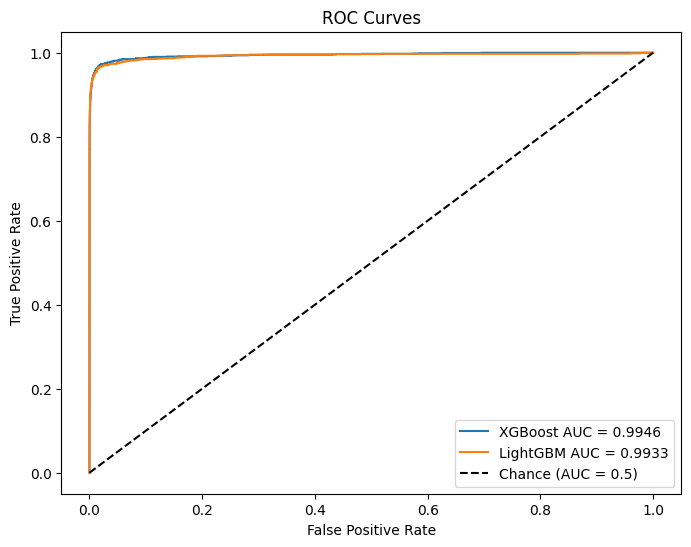

In [34]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

y_proba_xgboost = xgboost.predict_proba(X_test)[:, 1] 
y_proba_rf = lgbm.predict_proba(X_test)[:, 1]

# Calcular AUC
auc_xgboost = roc_auc_score(y_test, y_proba_xgboost)
auc_rf = roc_auc_score(y_test, y_proba_rf)

# Calcular puntos para la curva ROC
fpr_xgboost, tpr_xgboost, _ = roc_curve(y_test, y_proba_xgboost)
fpr_rf, tpr_rf, _ = roc_curve(y_test, y_proba_rf)

# Graficar la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr_xgboost, tpr_xgboost, label=f'XGBoost AUC = {auc_xgboost:.4f}')
plt.plot(fpr_rf, tpr_rf, label=f'LightGBM AUC = {auc_rf:.4f}')
plt.plot([0, 1], [0, 1], 'k--', label='Chance (AUC = 0.5)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves')
plt.legend(loc='lower right')
plt.show()

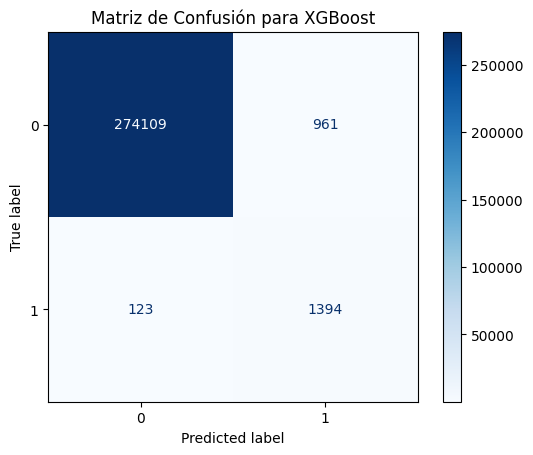

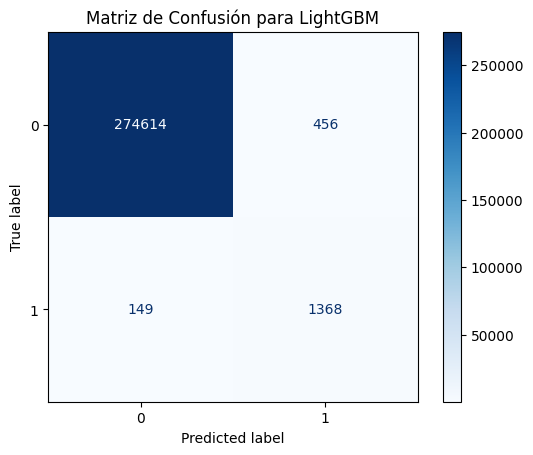

In [35]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm_xgboost = confusion_matrix(y_test, y_pred_xgboost)
disp_xgboost = ConfusionMatrixDisplay(confusion_matrix=cm_xgboost, display_labels=xgboost.classes_)
disp_xgboost.plot(cmap=plt.cm.Blues)
plt.title('Matriz de Confusión para XGBoost')
plt.show()

# Matriz de confusión para Random Forest
cm_rf = confusion_matrix(y_test, y_pred_lgbm)
disp_rf = ConfusionMatrixDisplay(confusion_matrix=cm_rf, display_labels=lgbm.classes_)
disp_rf.plot(cmap=plt.cm.Blues)
plt.title('Matriz de Confusión para LightGBM')
plt.show()

## Entrenamiento Incremental

In [36]:
start_date = '2020-01-01'
end_date = '2020-12-31'

# Filtrar el DataFrame
filtered_df = df[(df['trans_date_trans_time'] >= start_date) & (df['trans_date_trans_time'] <= end_date)]

X = filtered_df.select_dtypes(include=[np.number]).drop(columns=['is_fraud'])
y = filtered_df['is_fraud']

# Dividir el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Aplicar SMOTE con la nueva estrategia de muestreo
smote = SMOTE(sampling_strategy={1: desired_minority_class_count}, random_state=42)
X_new_train_smote, y_new_train_smote = smote.fit_resample(X_train, y_train)

In [37]:
X_combined = np.vstack([X_train_smote, X_new_train_smote])
y_combined = np.concatenate([y_train_smote, y_new_train_smote])

# Re-train the model with the combined dataset
xgboost.fit(X_combined, y_combined)

# Predict on the test set
y_pred_new_xgboost = xgboost.predict(X_test)

In [38]:
# Incremental training using the existing model
lgbm.fit(X_new_train_smote, y_new_train_smote, init_model=lgbm.booster_)

# Predict on the test set
y_pred_new_lgbm = lgbm.predict(X_test)

[LightGBM] [Info] Number of positive: 1925061, number of negative: 643846
[LightGBM] [Info] Total Bins 4084
[LightGBM] [Info] Number of data points in the train set: 2568907, number of used features: 18
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

In [39]:
print_metrics(y_test, y_pred_new_xgboost, "XGBoost")

print_metrics(y_test, y_pred_new_lgbm, "LightGBM")

Métricas para XGBoost:
Accuracy: 0.9945
Precision: 0.4706
Recall: 0.9464
F1-Score: 0.6286


Métricas para LightGBM:
Accuracy: 0.9237
Precision: 0.0568
Recall: 0.9317
F1-Score: 0.1070




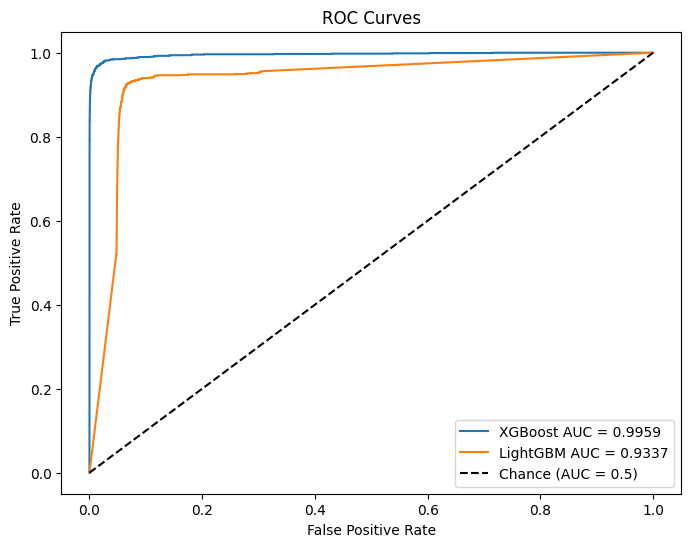

In [40]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

y_proba_xgboost = xgboost.predict_proba(X_test)[:, 1] 
y_proba_rf = lgbm.predict_proba(X_test)[:, 1]

# Calcular AUC
auc_xgboost = roc_auc_score(y_test, y_proba_xgboost)
auc_rf = roc_auc_score(y_test, y_proba_rf)

# Calcular puntos para la curva ROC
fpr_xgboost, tpr_xgboost, _ = roc_curve(y_test, y_proba_xgboost)
fpr_rf, tpr_rf, _ = roc_curve(y_test, y_proba_rf)

# Graficar la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr_xgboost, tpr_xgboost, label=f'XGBoost AUC = {auc_xgboost:.4f}')
plt.plot(fpr_rf, tpr_rf, label=f'LightGBM AUC = {auc_rf:.4f}')
plt.plot([0, 1], [0, 1], 'k--', label='Chance (AUC = 0.5)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves')
plt.legend(loc='lower right')
plt.show()

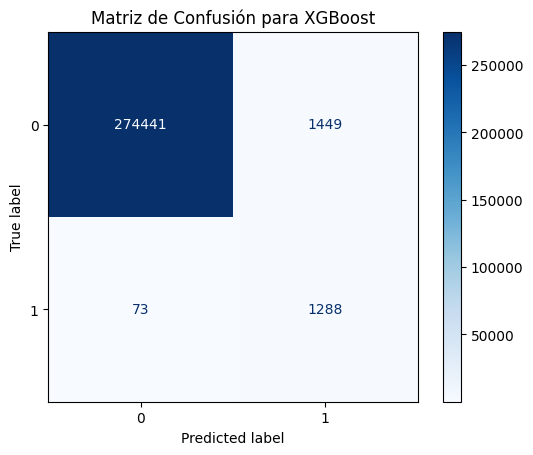

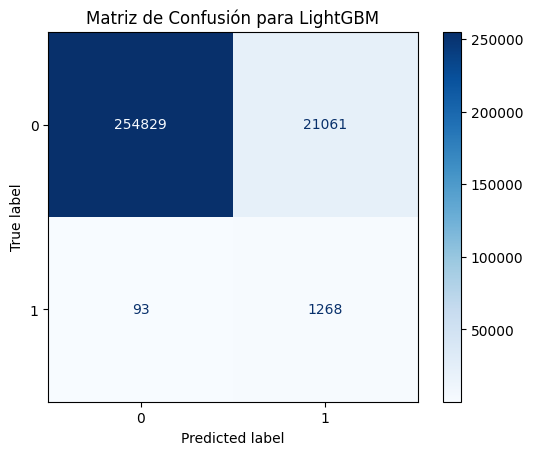

In [41]:
cm_xgboost = confusion_matrix(y_test, y_pred_new_xgboost)
disp_xgboost = ConfusionMatrixDisplay(confusion_matrix=cm_xgboost, display_labels=xgboost.classes_)
disp_xgboost.plot(cmap=plt.cm.Blues)
plt.title('Matriz de Confusión para XGBoost')
plt.show()

# Matriz de confusión para Random Forest
cm_rf = confusion_matrix(y_test, y_pred_new_lgbm)
disp_rf = ConfusionMatrixDisplay(confusion_matrix=cm_rf, display_labels=lgbm.classes_)
disp_rf.plot(cmap=plt.cm.Blues)
plt.title('Matriz de Confusión para LightGBM')
plt.show()